In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from moviepy.editor import VideoFileClip

In [2]:
import importlib
import helpers #various utils e.g. thresholding, image preprocessing that I put there 

In [3]:
importlib.reload(helpers)

<module 'helpers' from '/Users/wwymak/computer-science-courses/self-driving-car-projects/CarND-Advanced-Lane-Lines/helpers.py'>

### Camera calibration

Before starting on finding lane lines, the camera has to be corrected for distortion. This is done by calibrating it using the checkboard squares images. The calibration uses the `cv2.calibrateCamera` function

In [119]:
def img2Gray(filename):    
    img = cv2.imread(filename)
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [120]:
# get the list of images for calibration
images = glob.glob('camera_cal/calibration*.jpg')
img_gray = [img2Gray(x) for x in images]

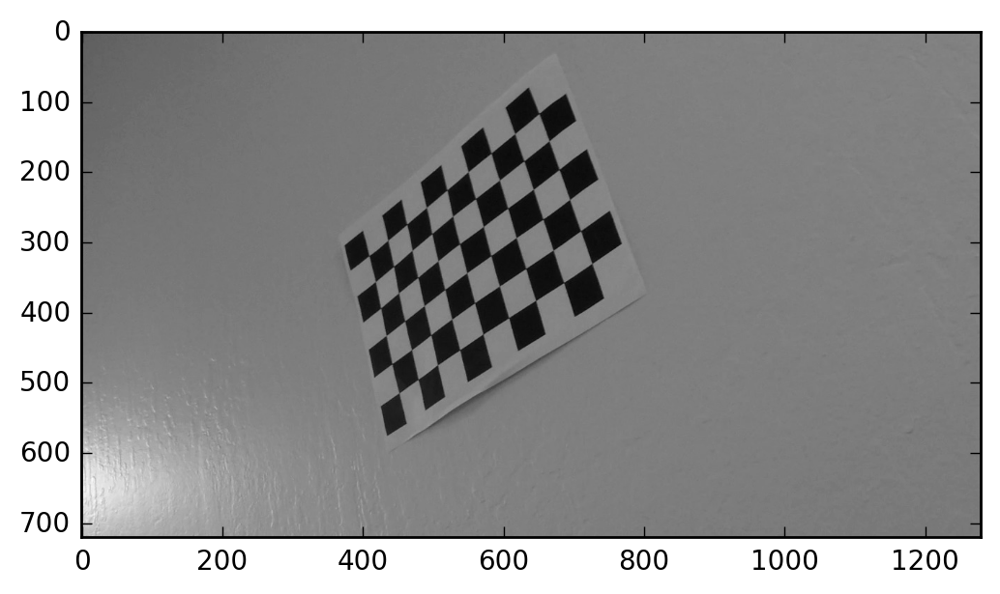

In [5]:
# quick sanity check of images:
plt.imshow(img_gray[4], cmap='gray')

#### Setting the calibration params
As can be seen from the image, the chessboard is in a 9 x 6 grid

In [6]:
chessgrid_size = (9,6)
# object points == the grid positions, image_points are positions in the image where the corners are
object_points = np.zeros((9*6 ,3), np.float32)
object_points[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

In [7]:
# find the corners in the images with cv2 findChessboardCorners function
img_points_arr = []
obj_points_arr = []
def find_corners(img, chessgridsize):
    ret, corners = cv2.findChessboardCorners(img, chessgridsize,None)
    if ret == True:
        img_points_arr.append(corners)
        obj_points_arr.append(object_points)
        
for i in range(len(img_gray)):
    find_corners(img_gray[i], chessgrid_size)

In [12]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points_arr, img_points_arr, img_gray[0].shape[::-1],None,None)
# ret == return, whether cv2 can calibratie successfully, mtx == camera matrix, 
# dist== distortion, 
#rvects/tvects==rotation vector, translation vector

In [13]:
np.save('calibrations/camera_calibration.npy', {'mtx': mtx, 'dist': dist})

---

### Correct for camera distortion

In [121]:
# reload values-- can resume from here if notebook crashes etc
camera_calibration = np.load('camera_calibration.npy').item()
dist = camera_calibration['dist']
mtx = camera_calibration['mtx']

After distortion correction, images look like so:

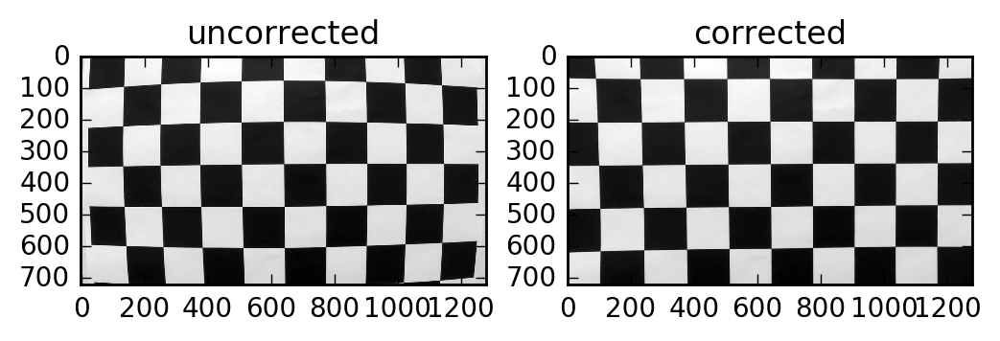

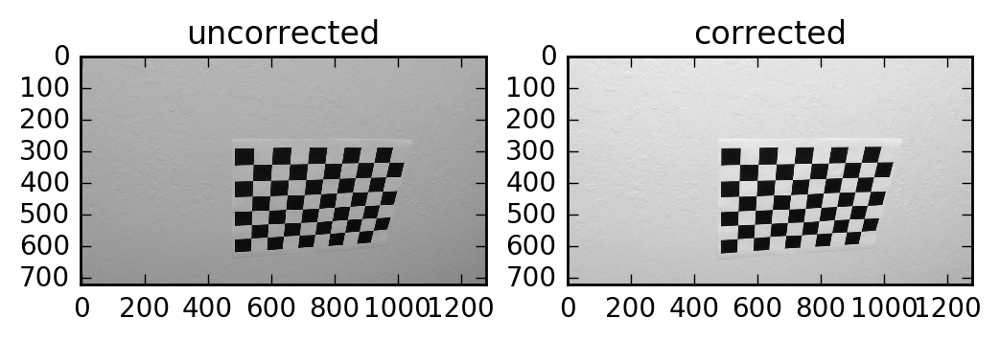

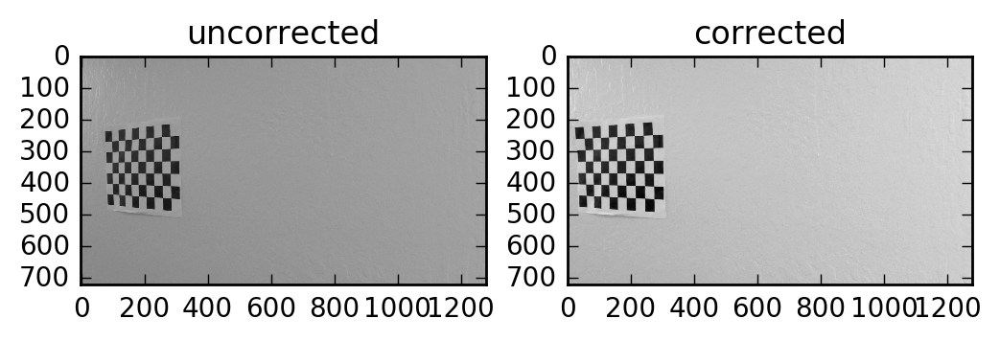

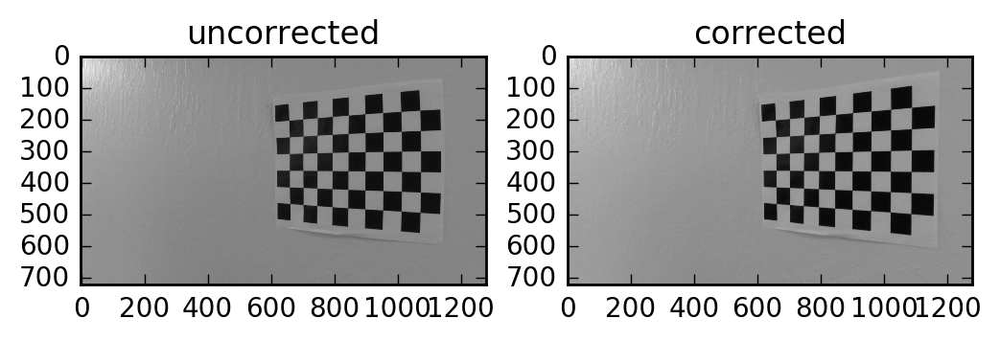

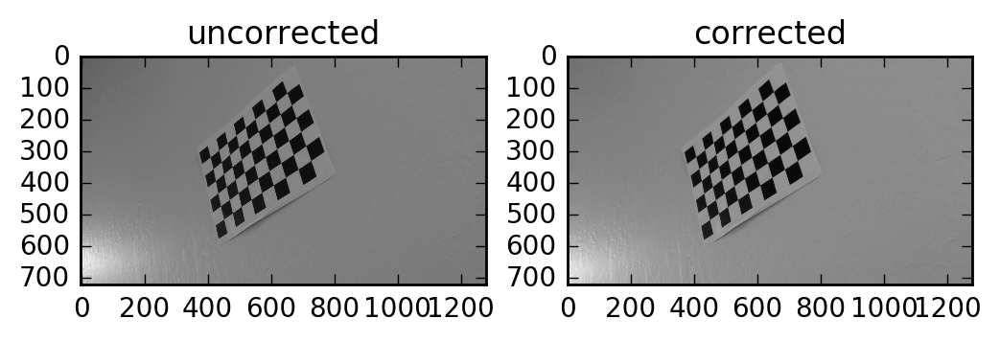

...

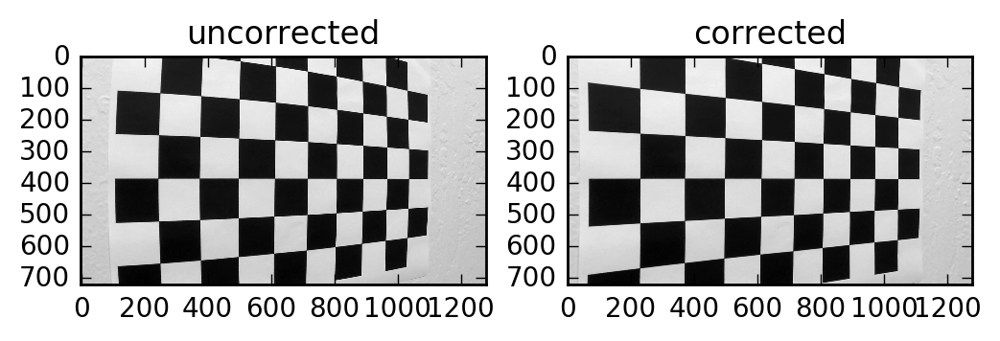

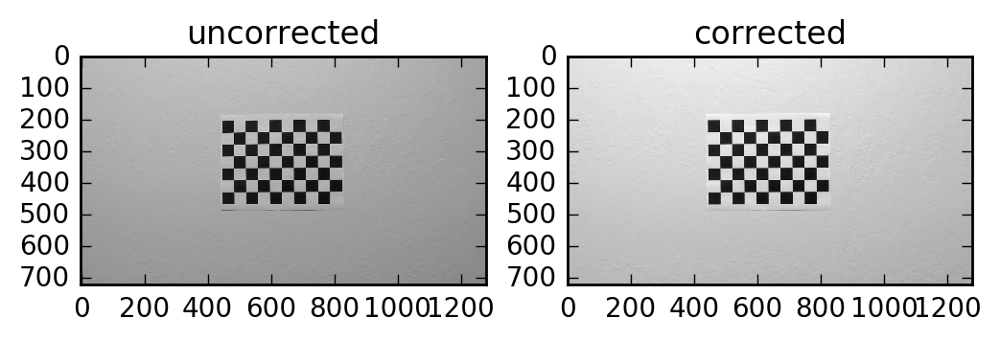

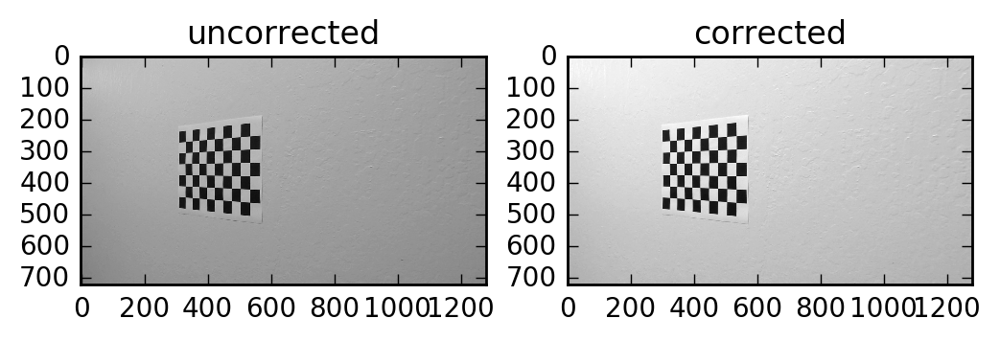

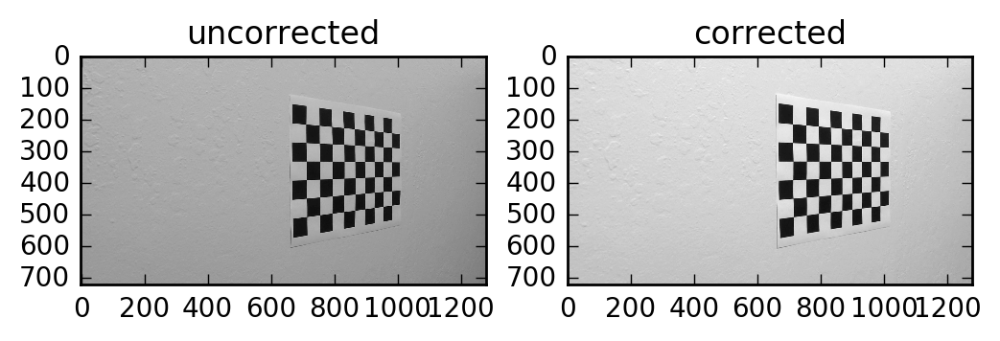

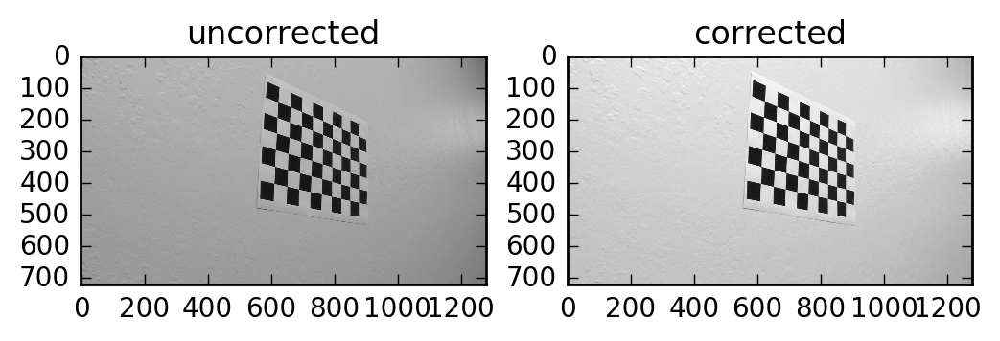

In [123]:
for i in images:
    cal_image = img2Gray(i)
    undistorted_cal_img = cv2.undistort(cal_image, mtx, dist, None, mtx)
    filepath = 'output_images'+ i.replace('camera_cal', '')
    cv2.imwrite(filepath,undistorted_cal_img)
    plt.figure()
    plt.grid(False)
    plt.title(i)
    ax = plt.subplot(1,2,1)
    ax.set_title('uncorrected')
    ax.imshow(cal_image, cmap='gray')
    ax2 = plt.subplot(1,2,2)
    ax2.set_title('corrected')
    ax2.imshow(undistorted_cal_img, cmap='gray')

The distortion calibration seems okay, so undistort the test images as a first step for the lane detection pipeline

In [124]:
test_images_fnames = glob.glob('test_images/test*.jpg')
test_images = [cv2.imread(x) for x in test_images_fnames]
undistorted = [cv2.undistort(x, mtx, dist, None, mtx) for x in test_images]

In [ ]:
# save the corrected images
for idx, img in enumerate(undistorted):
    fname = test_images_fnames[idx].replace('.jpg', '').replace('test_images', 'output_images') + '_camera_corrected.jpg'
    cv2.imwrite(fname ,img)

Here's an exmaple of the corrected test images

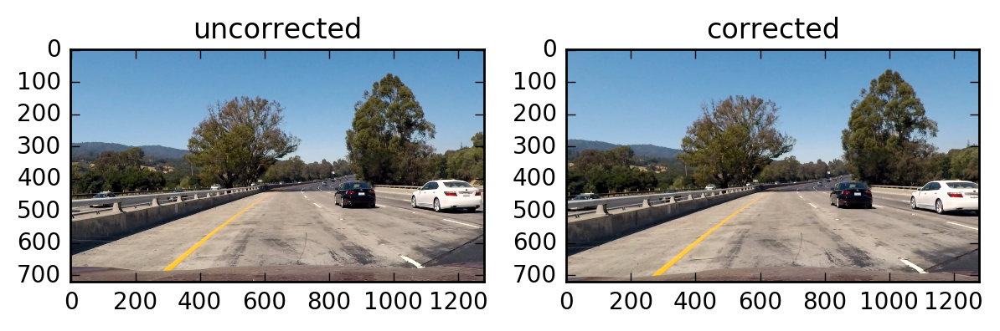

In [28]:
fig, ax0 = plt.subplots()
fig.set_size_inches(7, 4)
ax = plt.subplot(1,2,1)
ax.set_title('uncorrected')
ax.imshow(cv2.cvtColor(test_images[0], cv2.COLOR_BGR2RGB))
ax2 = plt.subplot(1,2,2)
ax2.set_title('corrected')
ax2.imshow(cv2.cvtColor(undistorted[0], cv2.COLOR_BGR2RGB))

---

### Image cleaning

Gaussian Blur is used to add denoising to the images, then histogram equalisation is applied to improve performance in different lighting conditions

In [4]:
def chlaheEqualisze(img):
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    imgs = []
    for i in range(img.shape[2]):
        img_chan = img[:,:,i]        
        cl = clahe.apply(img_chan)
        imgs.append(cl)

    eq_img = np.stack(np.array(imgs), axis=0)
    eq_img = np.rollaxis(eq_img, 0, 3)
    output = eq_img.copy()
    return output

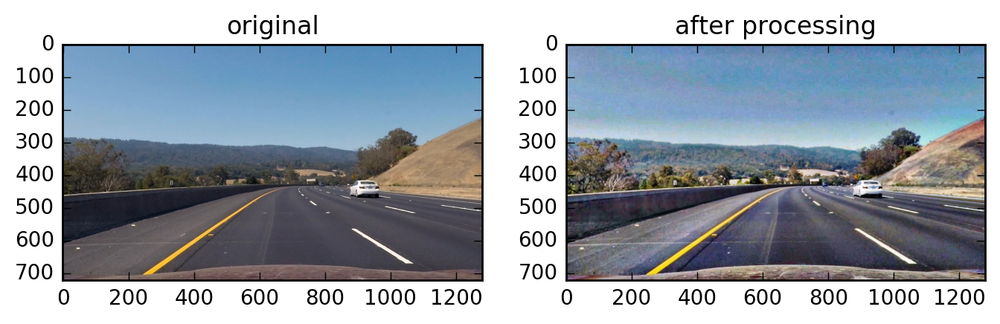

In [185]:
# test out the default params, which was obtained from various tweaks
#  it shows up really well in this image
test_img = undistorted[2]
blurred = cv2.GaussianBlur(test_img,(3,3),0)
equalised = chlaheEqualisze(blurred)

plt.figure(figsize=(8, 8))
ax = plt.subplot(1,2, 1)
ax.set_title('original')
ax.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB))

ax = plt.subplot(1,2, 2)
ax.set_title('after processing')
ax.imshow(cv2.cvtColor(equalised, cv2.COLOR_BGR2RGB))



### Thresholding

The use of the sobel transform (ie image gradient) to highlight the lines is investigated-- these include in the x and y directions, the magnitude and also the angle

In [125]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobel = np.absolute(sobel)
    scaled = np.uint8(255 * abs_sobel/np.max(abs_sobel))
    grad_binary = np.zeros_like(scaled)
    grad_binary[(scaled >= thresh[0]) & (scaled <= thresh[1])] = 1
    return grad_binary

def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    mag = np.sqrt(np.square(sobelx) + np.square(sobely))
    scaled = np.uint8(255 * mag/np.max(mag))
    mag_binary = np.zeros_like(scaled)
    mag_binary[(scaled >= mag_thresh[0]) & (scaled <= mag_thresh[1])] = 1
    return mag_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_gradient = np.arctan2(np.absolute(sobely) ,np.absolute(sobelx))
    dir_binary = np.zeros_like(abs_gradient)
    dir_binary[(abs_gradient >= thresh[0]) & (abs_gradient <= thresh[1])] = 1
    return dir_binary

In [126]:
def calculate_thresholded_imgs(inputImg, sksize = 3,threshx = (15,90),threshy = (30, 90)
                               ,mag_thresh = (30,100), dir_thresh = (0.7, 1.3)):
    gradx = abs_sobel_thresh(inputImg, orient='x', sobel_kernel=sksize, thresh=threshx)
    grady = abs_sobel_thresh(inputImg, orient='y', sobel_kernel=sksize, thresh=threshy)
    mag_binary = mag_threshold(inputImg, sobel_kernel=sksize, mag_thresh=mag_thresh)
    dir_binary = dir_threshold(inputImg, sobel_kernel=sksize, thresh = dir_thresh)
    
    return gradx, grady, mag_binary, dir_binary

def calculate_combined_sobel(gradx, grady, mag_binary, dir_binary):
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

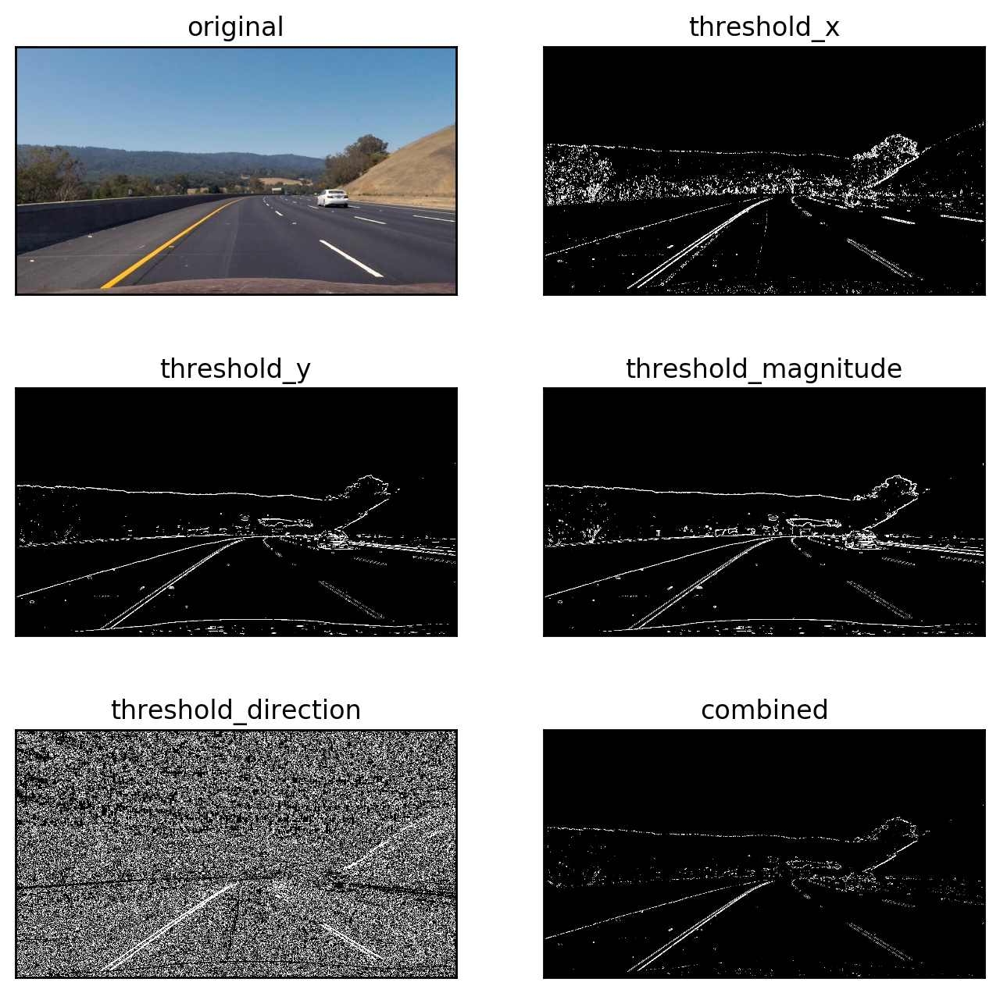

In [62]:
# test out the default params, which was obtained from various tweaks
#  it shows up really well in this image
test_img = undistorted[2]
gradx_img, grady_img, mag_binary_img, dir_binary_img = calculate_thresholded_imgs(test_img)
combined_img = calculate_combined_sobel(gradx_img, grady_img, mag_binary_img, dir_binary_img)
images_to_plot = [cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB), gradx_img, grady_img, 
                  mag_binary_img, dir_binary_img, combined_img]
titles = ['original', 'threshold_x', 'threshold_y', 'threshold_magnitude', 'threshold_direction','combined']
fig = plt.figure(figsize=(8, 8))
for idx, currimg in enumerate(images_to_plot):
    ax = fig.add_subplot(3,2, idx +1)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.set_title(titles[idx])
    ax.grid(False)
    if(idx == 0):
        ax.imshow(currimg)
    else:
        ax.imshow(currimg, cmap='gray')


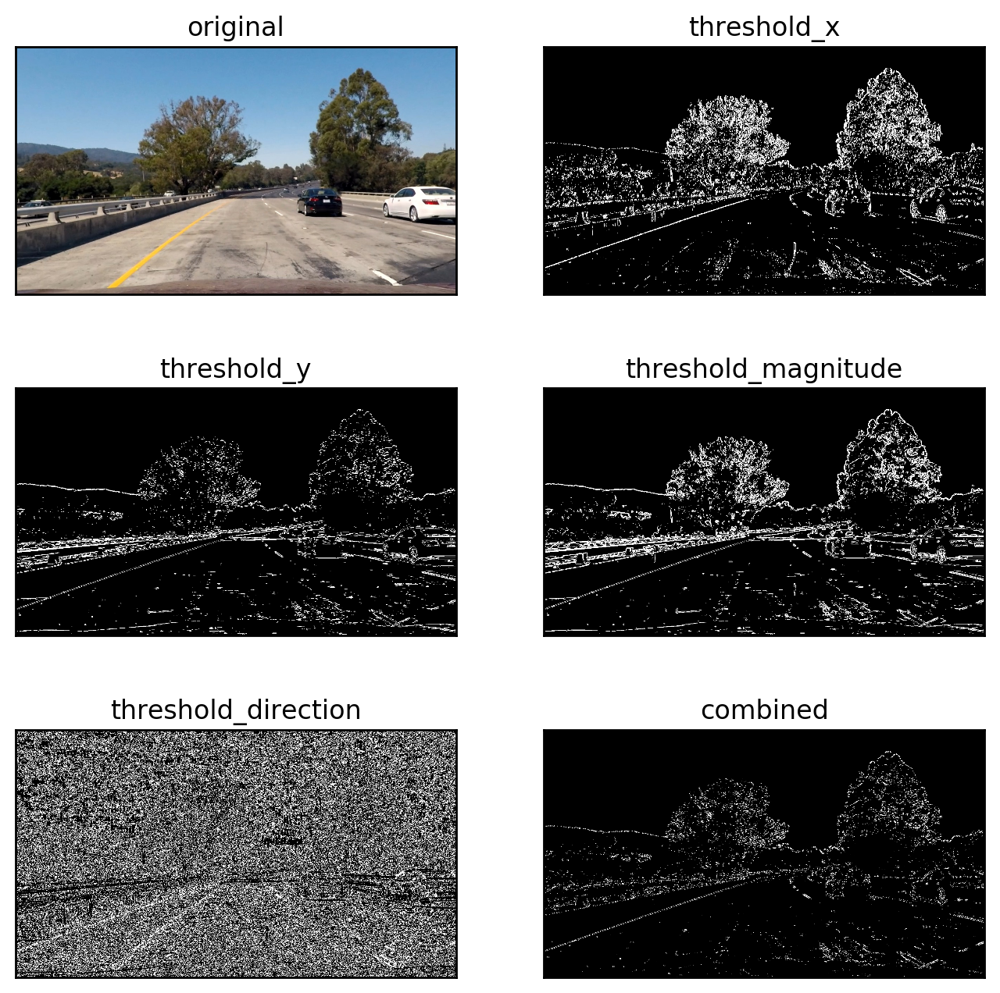

In [63]:
# and on another image-- but quite a lot less clear...
test_img = undistorted[0]
gradx_img, grady_img, mag_binary_img, dir_binary_img = calculate_thresholded_imgs(test_img)
combined_img = calculate_combined_sobel(gradx_img, grady_img, mag_binary_img, dir_binary_img)
images_to_plot = [cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB), gradx_img, grady_img, 
                  mag_binary_img, dir_binary_img, combined_img]
titles = ['original', 'threshold_x', 'threshold_y', 'threshold_magnitude', 'threshold_direction','combined']
fig = plt.figure(figsize=(8, 8))
for idx, currimg in enumerate(images_to_plot):
    ax = fig.add_subplot(3,2, idx +1)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.set_title(titles[idx])
    ax.grid(False)
    if(idx == 0):
        ax.imshow(currimg)
    else:
        ax.imshow(currimg, cmap='gray')


#### Color thresholding
Besides the image gradients, color is also useful to identify lines since they have a big difference to the road color. The R channel in RGB images and the S channel in HLS color space are good candidates for color thresholding

In [127]:
def color_threshold(img, thresh=(0,255), cspace= 'HLS'):
    if cspace== 'HLS':        
        img_transformed = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    else:
        img_transformed = img
    channel = img_transformed[:,:,2] #if using the R channel it's also the last one
    binary_output = np.zeros_like(channel)
    binary_output[(channel >= thresh[0]) & (channel <= thresh[1])] = 1
    return binary_output

In [577]:
# test
hls_binary = color_threshold(undistorted[2], thresh=(70,255), cspace= 'HLS')
bgr_binary = color_threshold(undistorted[2], thresh=(150,255), cspace= 'RGB')

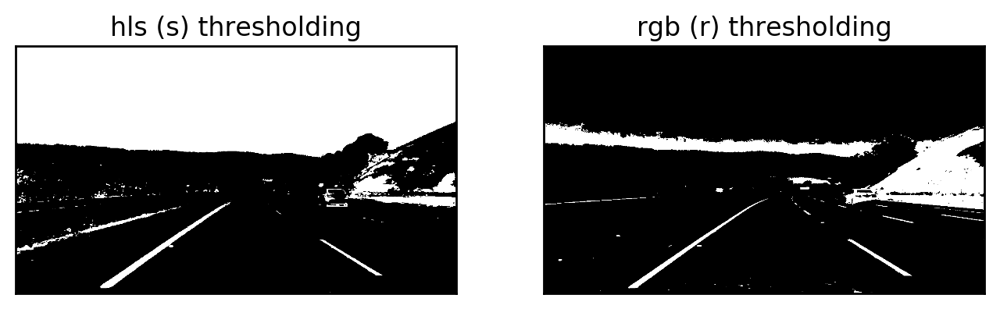

In [578]:
titles = ['hls (s) thresholding', 'rgb (r) thresholding']
fig = plt.figure(figsize=(8, 8))
for idx, currimg in enumerate([hls_binary,bgr_binary ]):
    ax = fig.add_subplot(1,2, idx +1)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.set_title(titles[idx])
    ax.grid(False)
    ax.imshow(currimg, cmap='gray')

In [5]:
# might want to change the & to a | if found to be too strict
def calculate_combined_color(hls_binary, bgr_binary):
    combined = np.zeros_like(hls_binary)
    combined[(hls_binary == 1) & (bgr_binary == 1)] = 1
    return combined

In [167]:
combined_color_img = calculate_combined_color(hls_binary, bgr_binary)

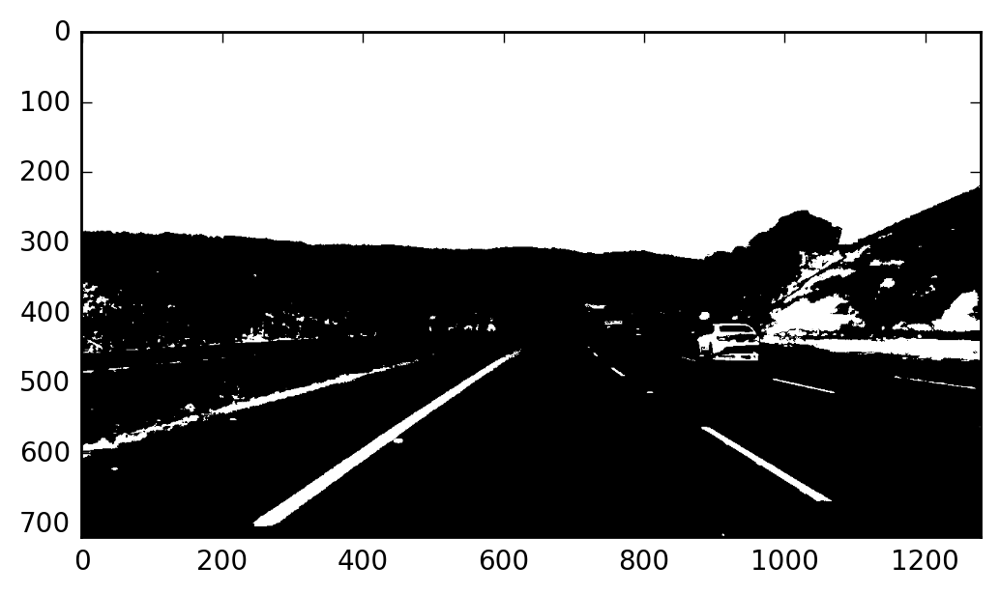

In [168]:
plt.imshow(combined_color_img, cmap='gray')

In [128]:
# let's put everything together for color
def color_thresholding_pipeline(imgin):
    def color_threshold(img, thresh=(0,255), cspace= 'HLS'):
        if cspace== 'HLS':        
            img_transformed = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
        else:
            img_transformed = img
        channel = img_transformed[:,:,2] #if using the R channel it's also the last one
        binary_output = np.zeros_like(channel)
        binary_output[(channel >= thresh[0]) & (channel <= thresh[1])] = 1
        return binary_output
    def calculate_combined_color(hls_binary, bgr_binary):
        combined = np.zeros_like(hls_binary)
        combined[(hls_binary == 1) & (bgr_binary == 1)] = 1
        return combined
    hls_binary = color_threshold(imgin, thresh=(70,255), cspace= 'HLS')
    bgr_binary = color_threshold(imgin, thresh=(150,255), cspace= 'RGB')
    return  calculate_combined_color(hls_binary, bgr_binary), hls_binary, bgr_binary

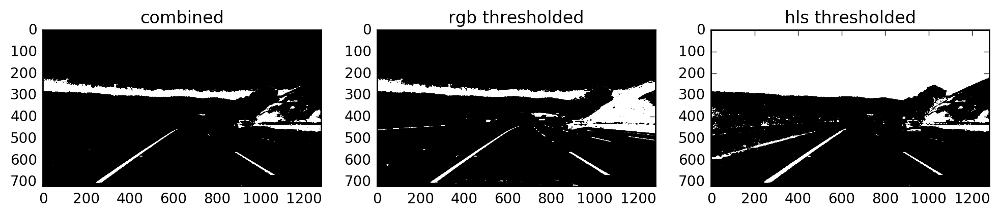

In [584]:
# test color thresholding only on the above test image which wasn't super great with sobel
test_img = undistorted[2]
combined_color_img_2, hls_binary, bgr_binary = color_thresholding_pipeline(test_img)

plt.figure(figsize=(12,8))
ax = plt.subplot(1,3,1)
ax.set_title('combined')
ax.imshow(combined_color_img_2, cmap='gray')

ax = plt.subplot(1,3,2)
ax.set_title('rgb thresholded')
ax.imshow(bgr_binary, cmap='gray')

ax = plt.subplot(1,3,3)
ax.set_title('hls thresholded')
ax.imshow(hls_binary, cmap='gray')


The color thresholding actually seems a lot more promising than the sobel transforms-- let see if it's sufficient to use this only

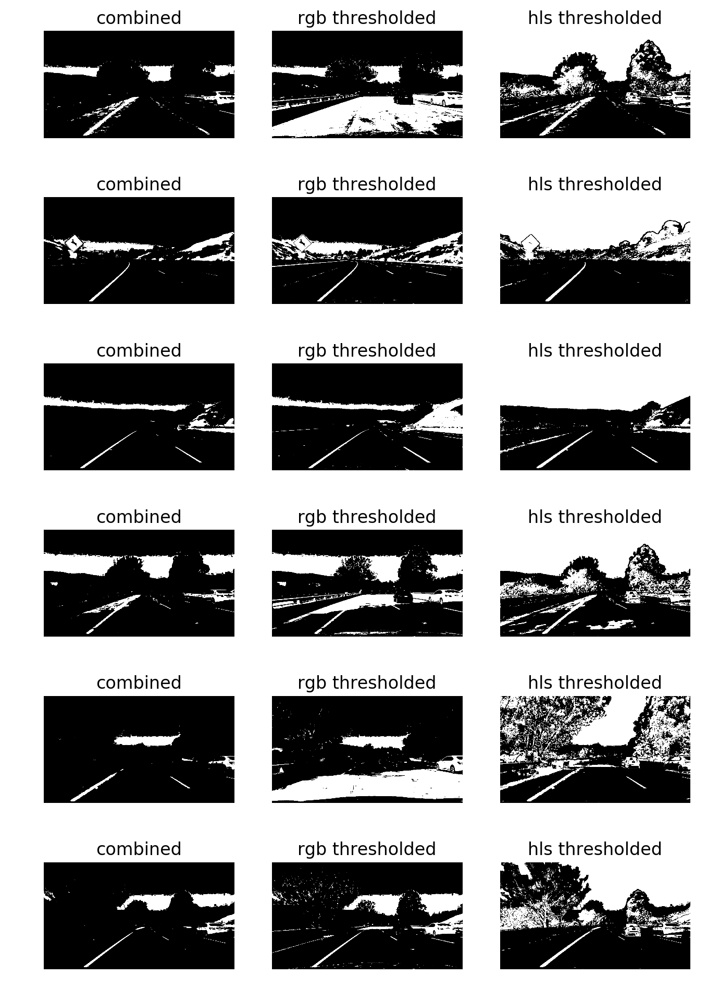

In [132]:
plt.figure(figsize=(8,12))
plt.axis('off')
for idx, test_img in enumerate(undistorted):
    combined_color_img_2, hls_binary, bgr_binary = color_thresholding_pipeline(test_img)

#     plt.figure(figsize=(8,5))
#     plt.axis('off')
    ax = plt.subplot(len(undistorted),3,1 + 3 * idx)
    ax.set_title('combined')
    ax.axis('off')
    ax.imshow(combined_color_img_2, cmap='gray')

    ax = plt.subplot(len(undistorted),3,2+ 3 * idx)
    ax.set_title('rgb thresholded')
    ax.axis('off')
    ax.imshow(bgr_binary, cmap='gray')

    ax = plt.subplot(len(undistorted),3,3+ 3 * idx)
    ax.set_title('hls thresholded')
    ax.axis('off')
    ax.imshow(hls_binary, cmap='gray')
plt.savefig('output_images/color_thresholding_example_all.jpg')

The color thresholdinng doesn't seem sufficient to handle images with a lot of light and shadow, so more tests with the sobel thresholding and color combined:

In [593]:
def combined_thresholding(sobel_bin, color_binary):   
    combined = np.zeros_like(sobel_bin)
    combined[(sobel_bin == 1) | (color_binary == 1)] = 1
    # combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1)) & (dir_binary == 1)] = 1
    return combined

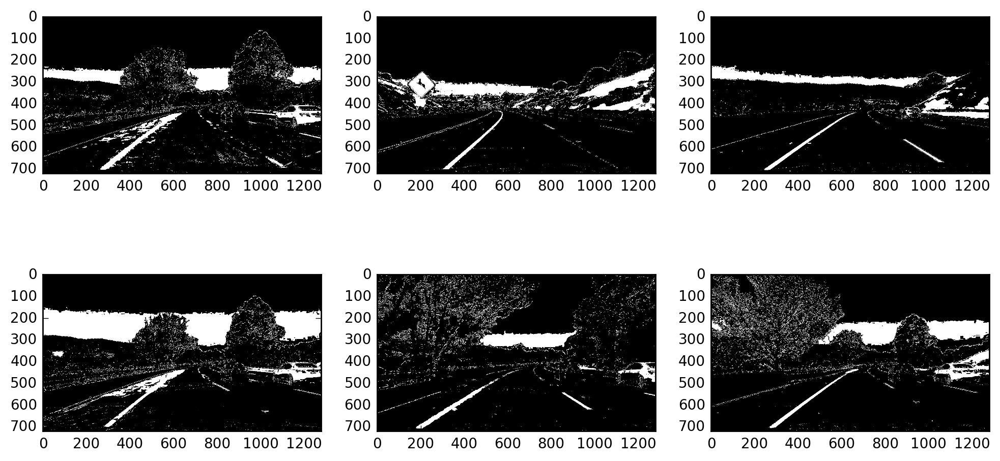

In [596]:
plt.figure(figsize=(12, 6))
for i, test_img in enumerate(undistorted):
    gradx_img, grady_img, mag_binary_img, dir_binary_img = calculate_thresholded_imgs(test_img)
    combined_sobel_img = calculate_combined_sobel(gradx_img, grady_img, mag_binary_img, dir_binary_img)
    combined_color_img_2, hls_binary, bgr_binary = color_thresholding_pipeline(test_img)
    
    combined_img = combined_thresholding(combined_sobel_img,combined_color_img_2 )

#     plt.figure(figsize=(8,5))
    ax = plt.subplot(2,3,i+1)
#     ax.set_title('combined')
    ax.imshow(combined_img, cmap='gray')

---

### Perspective Transform

Next, we want to get the transformation matrix to convert to bird's eye view and back.

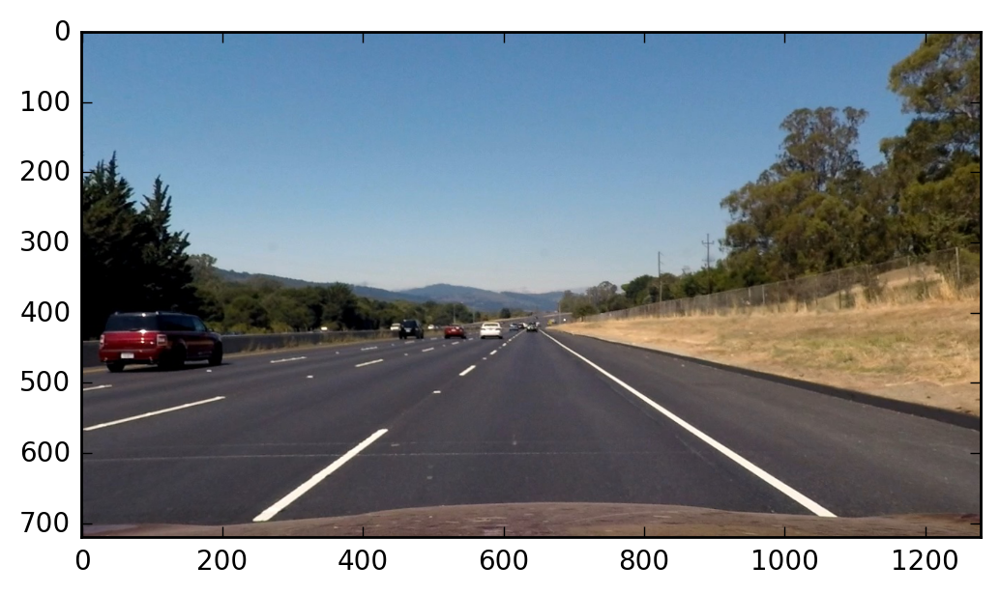

In [102]:
# One of the iamges to be used for the conversion
straightlines = cv2.cvtColor(cv2.imread('test_images/straight_lines2.jpg'), cv2.COLOR_BGR2RGB)
straightlines = cv2.undistort(straightlines, mtx, dist, None, mtx)
plt.imshow(straightlines)


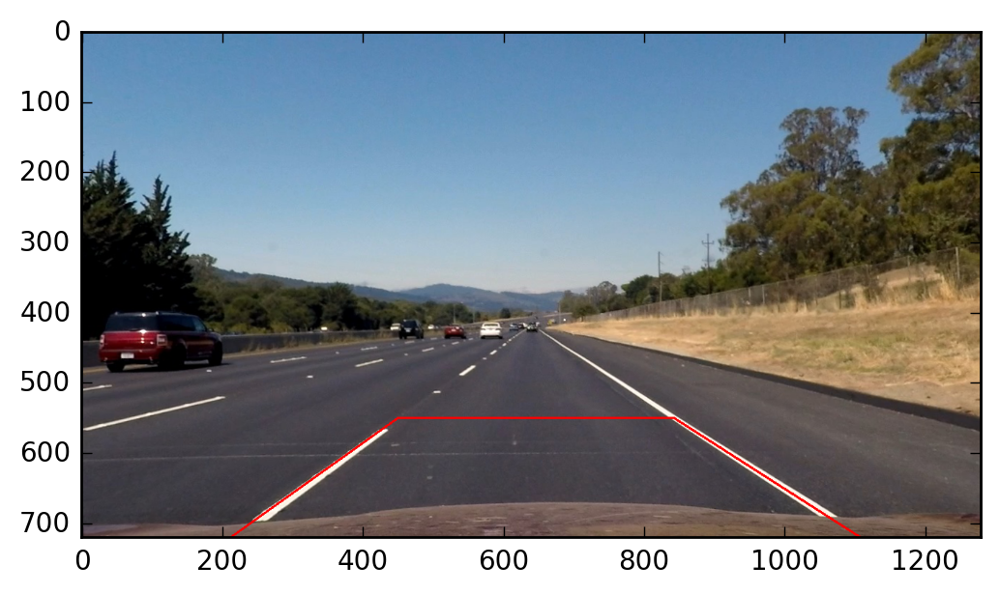

In [111]:
# find the corners and the straightlines (make sure they go in clockwise direction)
corners = [[205, 725], [450,550], [842,550], [1115, 725]]
lines_arr = [corners[0]+ corners[1],corners[1]+corners[2] ,corners[2]+ corners[3],corners[3]+corners[0]]
lines_output = helpers.draw_lines(np.copy(straightlines), lines_arr)
plt.imshow(lines_output)

In [112]:
# dst_corners = [[300, 725], [300,0], [900,0], [900, 725]]
dst_corners = [[205, 725], [205,550], [1115,550], [1115, 725]]
src = np.float32(corners)
dst = np.float32(dst_corners)
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)


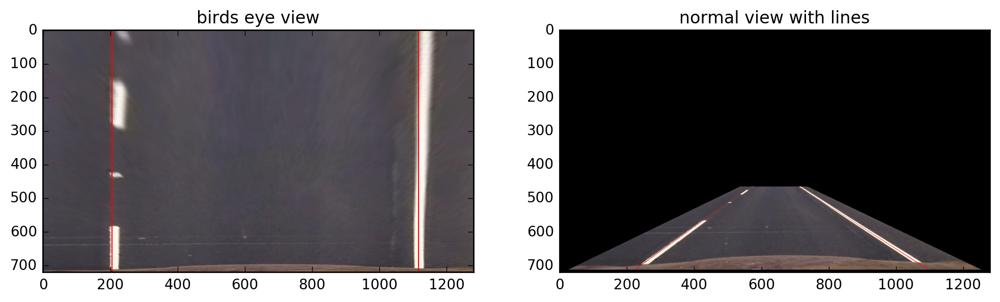

In [113]:
warped = cv2.warpPerspective(straightlines, M, (straightlines.shape[1], straightlines.shape[0]), flags=cv2.INTER_LINEAR)
# warped_lines = [[300,725, 300,0], [900, 725, 900, 0]]
warped_lines = [[205,725, 205,0], [1115, 725, 1115, 0]]

img_birds_eye = helpers.draw_lines(warped, warped_lines)
img_normal  = cv2.warpPerspective(img_birds_eye, Minv, (straightlines.shape[1], straightlines.shape[0]), flags=cv2.INTER_LINEAR)

plt.figure(figsize=(12,8))
ax = plt.subplot(1,2,1)
ax.set_title('birds eye view')
ax.imshow(img_birds_eye)

ax = plt.subplot(1,2,2)
ax.set_title('normal view with lines')
ax.imshow(img_normal)

In [114]:
np.save('perspective_transform_matrix_2.npy', M)
np.save('perspective_transform_matrix_inv_2.npy', Minv)
plt.savefig('output_images/perspective_transform_2.jpg')

---

In [7]:
M = np.load('perspective_transform_matrix_2.npy')
Minv = np.load('perspective_transform_matrix_inv_2.npy')

### Line detection

Now that the calibration for the camera and the transformation matrices calculated, and also tuned the thresholding functions, the line detection part can now get to work on the cleaned up images. 

The preprocessing step for each image before lane finding is
1. correct for camera distortion
2. warp to top view
3. threshold

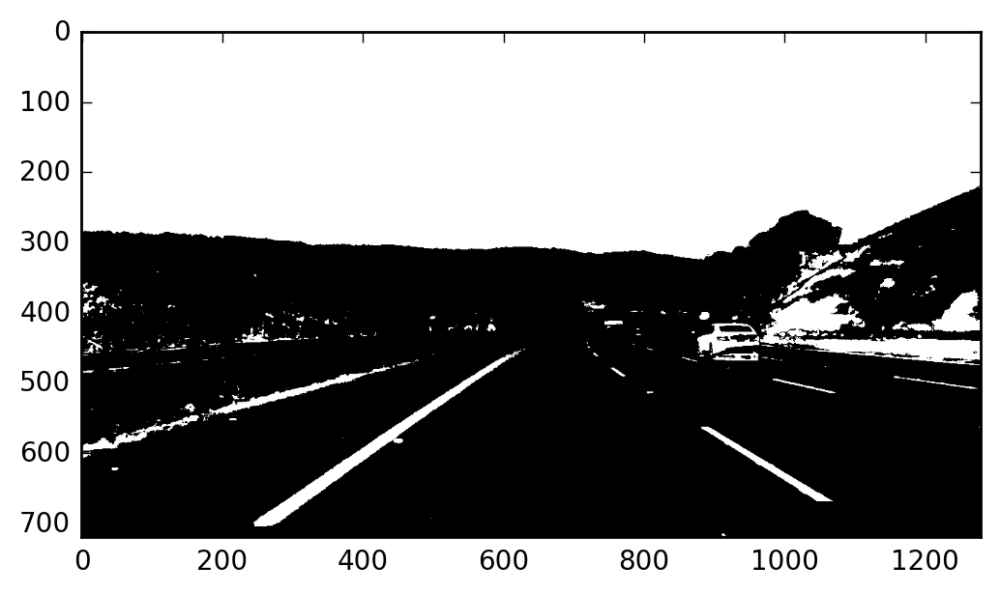

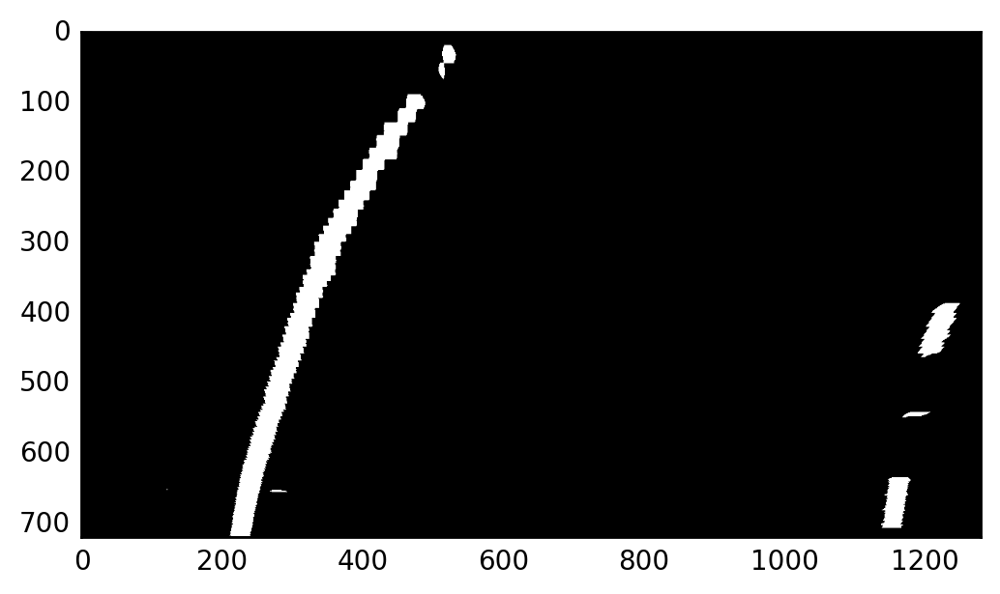

In [552]:
test_img = undistorted[5]
blurred = cv2.GaussianBlur(test_img,(3,3),0)
equalised = chlaheEqualisze(blurred)

color_thresholded, hls_bin, rgb_bin = color_thresholding_pipeline(equalised)
plt.figure()
plt.imshow(color_thresholded,cmap='gray')
topview = cv2.warpPerspective(rgb_bin, M, (color_thresholded.shape[1], color_thresholded.shape[0]), flags=cv2.INTER_LINEAR)
plt.figure()
plt.imshow(topview,cmap='gray')


#### Histogram method

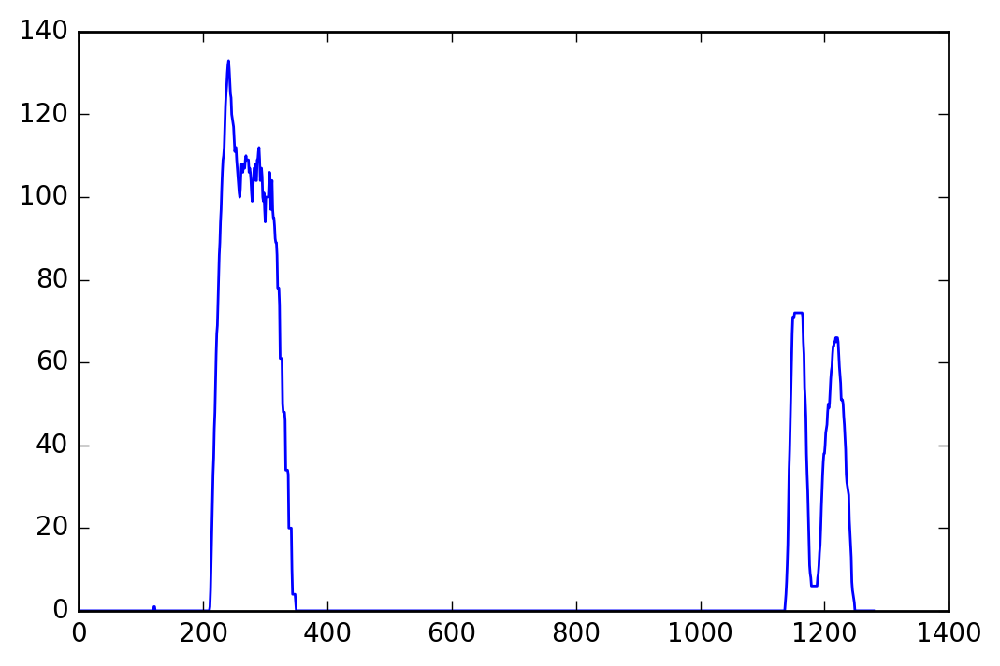

In [553]:
# find where the peaks are across a line in the middle of the image
histogram = np.sum(topview[topview.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [554]:
midpoint = np.int(histogram.shape[0]/2)
left_peak = np.argmax(histogram[:midpoint])
right_peak = np.argmax(histogram[midpoint:]) + midpoint

nwindows = 9
window_height = np.int(topview.shape[0] / nwindows)

# find where all the potenial lane pixels are
nonzero = topview.nonzero()
nonzero_x = np.array(nonzero[1])
nonzero_y = np.array(nonzero[0])

In [555]:
# make copy of image to work with
im= np.copy(topview)
img_cur = np.stack((im, im, im), -1) * 255
# set the peak positions
leftpeak_curr = left_peak
rightpeak_curr = right_peak

margin= 150
minpix =50

leftlaneidx = []
rightlaneidx = []


In [556]:
for i in range(nwindows):
    #get coordinates of the windows
    win_y_bottom = img_cur.shape[0] - (i + 1) * window_height
    win_y_top = img_cur.shape[0] - i * window_height
    win_x_left_low = leftpeak_curr - margin
    win_x_left_high = leftpeak_curr + margin
    win_x_right_low = rightpeak_curr - margin
    win_x_right_high = rightpeak_curr + margin
    
    
    left_indexes = ((nonzero_y >= win_y_bottom) & (nonzero_y < win_y_top) & 
                    (nonzero_x >= win_x_left_low) & (nonzero_x < win_x_left_high)).nonzero()[0]
    right_indexes = ((nonzero_y >= win_y_bottom) & (nonzero_y < win_y_top) & 
                    (nonzero_x > win_x_right_low) & (nonzero_x < win_x_right_high)).nonzero()[0]
    
    leftlaneidx.append(left_indexes)
    rightlaneidx.append(right_indexes)
    
    if len(left_indexes) > minpix:
        leftpeak_curr = np.int(np.mean(nonzero_x[left_indexes]))
        cv2.rectangle(img_cur, (win_x_left_low, win_y_bottom), (win_x_left_high, win_y_top), (0,255,0), 2)
    if len(right_indexes) > minpix:
        rightpeak_curr = np.int(np.mean(nonzero_x[right_indexes]))
        cv2.rectangle(img_cur, (win_x_right_low, win_y_bottom), (win_x_right_high, win_y_top), (0,255,0), 2)
    
leftlaneidx = np.concatenate(leftlaneidx)
rightlaneidx = np.concatenate(rightlaneidx)

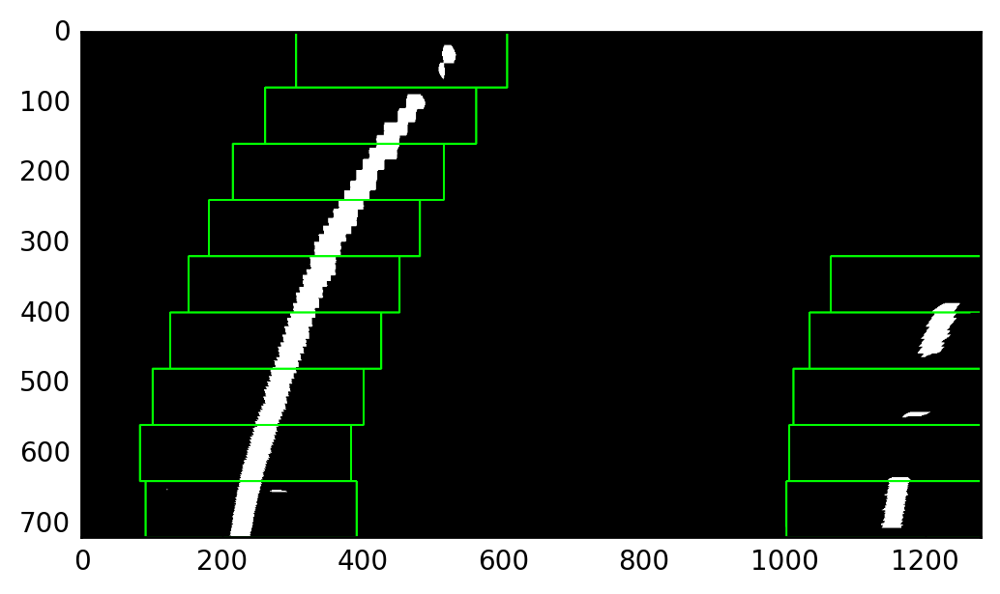

In [557]:
plt.imshow(img_cur)

In [558]:
leftx = nonzero_x[leftlaneidx]
lefty = nonzero_y[leftlaneidx] 
rightx = nonzero_x[rightlaneidx]
righty = nonzero_y[rightlaneidx] 

# Fit a second order polynomial to each
left_polyfit = np.polyfit(lefty, leftx, 2)
right_polyfit = np.polyfit(righty, rightx, 2)

(720, 0)

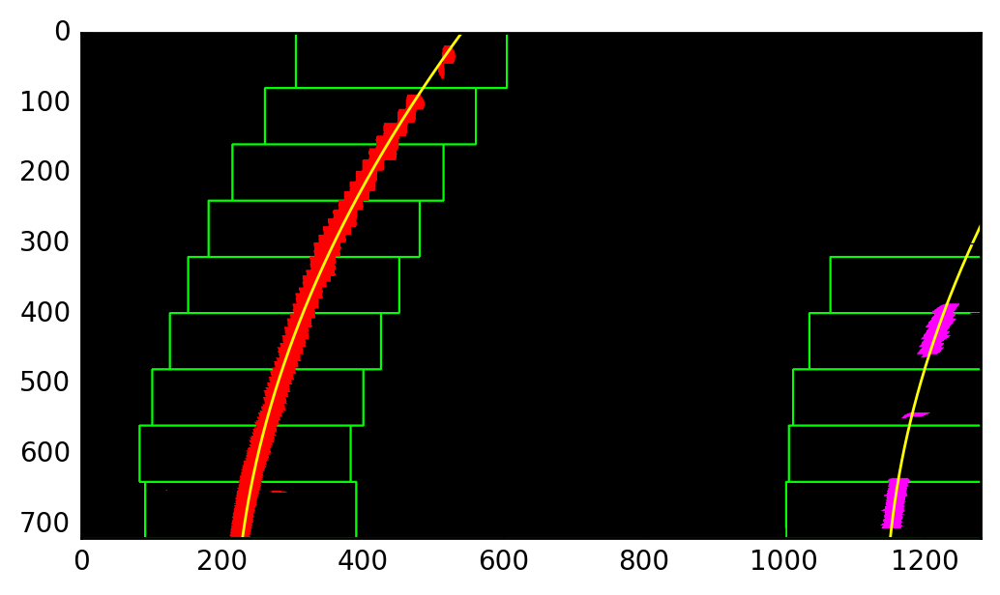

In [559]:
plotvals = np.linspace(0, img_cur.shape[0] - 1, img_cur.shape[0])
left_xvals = left_polyfit[2] + left_polyfit[1] * plotvals + left_polyfit[0] * plotvals **2
right_xvals = right_polyfit[2] + right_polyfit[1] * plotvals + right_polyfit[0] * plotvals **2
img_cur[nonzero_y[leftlaneidx], nonzero_x[leftlaneidx]] = [255, 0, 0]
img_cur[nonzero_y[rightlaneidx], nonzero_x[rightlaneidx]] = [255, 0, 255]
plt.imshow(img_cur)
plt.plot(left_xvals, plotvals, color='yellow')
plt.plot(right_xvals, plotvals, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

### Sliding window search

In [ ]:
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
	    # convolve the window into the vertical slice of the image
	    image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
	    conv_signal = np.convolve(window, image_layer)
	    # Find the best left centroid by using past left center as a reference
	    # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
	    offset = window_width/2
	    l_min_index = int(max(l_center+offset-margin,0))
	    l_max_index = int(min(l_center+offset+margin,image.shape[1]))
	    l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
	    # Find the best right centroid by using past right center as a reference
	    r_min_index = int(max(r_center+offset-margin,0))
	    r_max_index = int(min(r_center+offset+margin,image.shape[1]))
	    r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
	    # Add what we found for that layer
	    window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
	    l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
	    r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
	    # Add graphic points from window mask here to total pixels found 
	    l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
	    r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage= np.dstack((warped, warped, warped))*255 # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()

### Radius of curvature 

The radius of curvature for equation `f(y)=Ay^2 + By + C` is defined as:

`Rcurv = (1+(2Ay+B)^2)^1.5)/abs(2 * A)`

In [560]:
y_eval = np.max(plotvals)
left_curverad = ((1 + (2*left_polyfit[0]*y_eval + left_polyfit[1])**2)**1.5) / np.absolute(2*left_polyfit[0])
right_curverad = ((1 + (2*right_polyfit[0]*y_eval + right_polyfit[1])**2)**1.5) / np.absolute(2*right_polyfit[0])
print('left curvature: ' + str(left_curverad) + ' right curvature ' + str( right_curverad))


left curvature: 1246.04247459 right curvature 1212.26417902


To covert the above values to physical (rather than pixel) space

In [561]:
ym_per_pix = 30/360 # meters per pixel in y dimension
xm_per_pix = 3.7/950 # meters per pixel in x dimension

In [562]:
# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(plotvals * ym_per_pix, left_xvals*xm_per_pix, 2)
right_fit_cr = np.polyfit(plotvals * ym_per_pix, right_xvals*xm_per_pix, 2)
# radius of curvature in real space
left_curverad_actual = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad_actual = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

print(left_curverad_actual, 'm',right_curverad_actual, 'm')

2160.69186886 m 2127.46940851 m


### Addding the found lines to image:
After the best fit lines for the left and right lane lines are found, these can be transformed back from birds
eye view to 'normal' view and superimposed on the images (this function is defined in the helpers.py file)

In [459]:
test_img_processed = helpers.draw_lane_lines(test_img, left_xvals, right_xvals, plotvals, Minv)

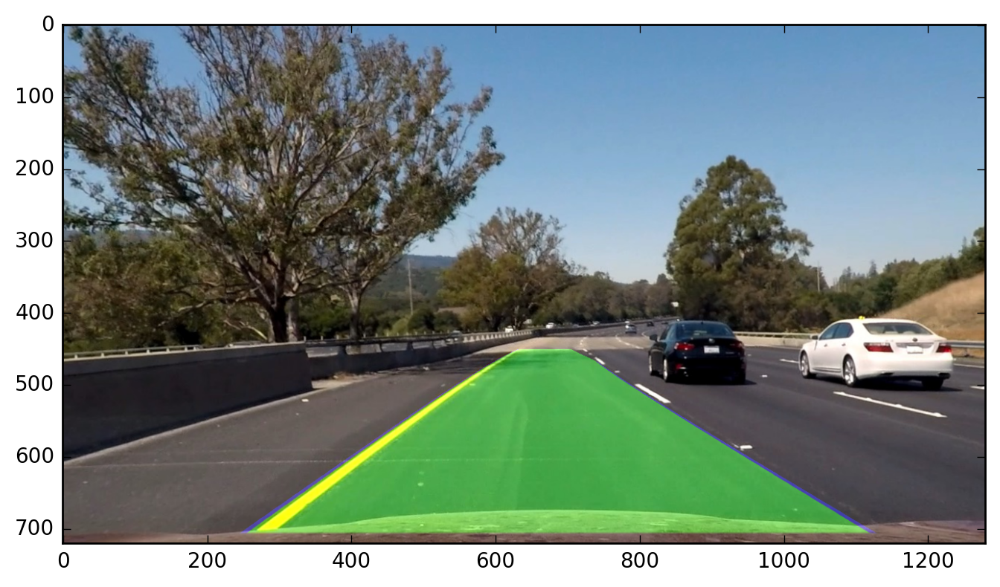

In [460]:
plt.figure(figsize=(8, 8))
plt.imshow(test_img_processed)

### Combining into pipeline function
Let's combine the above steps into a function that can be passed into the video builder

In [3]:
M = np.load('perspective_transform_matrix.npy')
Minv = np.load('perspective_transform_matrix_inv.npy')
camera_calibration = np.load('camera_calibration.npy').item()
dist = camera_calibration['dist']
mtx = camera_calibration['mtx']

In [61]:
class detector:
    def __init__(self, camera_calibration, M, Minv,color_threshold_method='RGB', 
                 color_thresh = (70,255), lane_finding_method='histogram'):
        self.image= None
        self.input = None
        
        self.camera_calibration = camera_calibration
        self.color_thresh = color_thresh
        self.color_threshold_method = color_threshold_method
        self.mtx = camera_calibration['mtx']
        self.dist = camera_calibration['dist']
        self.M = M
        self.Minv = Minv
        self.binary_image = None
        self.lane_finding_method = lane_finding_method
        
    def chlaheEqualisze(self, img):
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        imgs = []
        for i in range(img.shape[2]):
            img_chan = img[:,:,i]
            cl = clahe.apply(img_chan)
            imgs.append(cl)

        eq_img = np.stack(np.array(imgs), axis=0)
        eq_img = np.rollaxis(eq_img, 0, 3)
        return eq_img.copy()
        
    def sobel_thresholding(self, inputImg, sksize = 3,threshx = (15,90),threshy = (30, 90)
                               ,mag_thresh = (30,100), dir_thresh = (0.7, 1.3)):
        
        
        """
        # binary thresholding
        sksize = 3
        threshx = (15,90)
        threshy = (20, 90)
        mag_thresh = (30,100)
        dir_thresh = (0.7, 1.3)
        color_thresh = (70,255)
        """
    
        def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            if orient == 'x':
                sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
            else:
                sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

            abs_sobel = np.absolute(sobel)
            scaled = np.uint8(255 * abs_sobel/np.max(abs_sobel))
            grad_binary = np.zeros_like(scaled)
            grad_binary[(scaled >= thresh[0]) & (scaled <= thresh[1])] = 1
            return grad_binary

        def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
            sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
            mag = np.sqrt(np.square(sobelx) + np.square(sobely))
            scaled = np.uint8(255 * mag/np.max(mag))
            mag_binary = np.zeros_like(scaled)
            mag_binary[(scaled >= mag_thresh[0]) & (scaled <= mag_thresh[1])] = 1
            return mag_binary

        def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
            sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
            abs_gradient = np.arctan2(np.absolute(sobely) ,np.absolute(sobelx))
            dir_binary = np.zeros_like(abs_gradient)
            dir_binary[(abs_gradient >= thresh[0]) & (abs_gradient <= thresh[1])] = 1
            return dir_binary

        def calculate_thresholded_imgs(inputImg, sksize = 3,threshx = (15,90),threshy = (30, 90)
                                   ,mag_thresh = (30,100), dir_thresh = (0.7, 1.3)):
            gradx = abs_sobel_thresh(inputImg, orient='x', sobel_kernel=sksize, thresh=threshx)
            grady = abs_sobel_thresh(inputImg, orient='y', sobel_kernel=sksize, thresh=threshy)
            mag_binary = mag_threshold(inputImg, sobel_kernel=sksize, mag_thresh=mag_thresh)
            dir_binary = dir_threshold(inputImg, sobel_kernel=sksize, thresh = dir_thresh)

            return gradx, grady, mag_binary, dir_binary

        def calculate_combined_sobel(gradx, grady, mag_binary, dir_binary):
            combined = np.zeros_like(dir_binary)
            combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
            return combined
        
        gradx_img, grady_img, mag_binary_img, dir_binary_img = calculate_thresholded_imgs(inputImg, sksize ,threshx,threshy,mag_thresh, dir_thresh)
        return calculate_combined_sobel(gradx_img, grady_img, mag_binary_img, dir_binary_img)
        
        

    def combined_thresholding(self, sobel_bin, color_binary):   
        combined = np.zeros_like(sobel_bin)
        combined[(sobel_bin == 1) | (color_binary == 1)] = 1
        return combined

        
    def color_thresholding_pipeline(self, img):
        def color_threshold(img, thresh=(0,255), cspace= 'HLS'):
            if cspace== 'HLS':        
                img_transformed = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
            else:
                img_transformed = img
            channel = img_transformed[:,:,2] #if using the R channel it's also the last one
            binary_output = np.zeros_like(channel)
            binary_output[(channel >= thresh[0]) & (channel <= thresh[1])] = 1
            return binary_output
        def calculate_combined_color(hls_binary, bgr_binary):
            combined = np.zeros_like(hls_binary)
            combined[(hls_binary == 1) & (bgr_binary == 1)] = 1
            return combined
        
        hls_binary = color_threshold(img, thresh=(70,255), cspace= 'HLS')
        bgr_binary = color_threshold(img, thresh=(150,255), cspace= 'RGB')
        
        return  calculate_combined_color(hls_binary, bgr_binary), hls_binary, bgr_binary
    
    def histogram_method(self, binary_image):
        histogram = np.sum(binary_image[binary_image.shape[0]//2:,:], axis=0)
        midpoint = np.int(histogram.shape[0]/2)
        left_peak = np.argmax(histogram[:midpoint])
        right_peak = np.argmax(histogram[midpoint:]) + midpoint
        
        nwindows = 9
        window_height = np.int(binary_image.shape[0] / nwindows)

        # find where all the potenial lane pixels are
        nonzero = binary_image.nonzero()
        nonzero_x = np.array(nonzero[1])
        nonzero_y = np.array(nonzero[0])
        
        # make copy of image to work with
        im= np.copy(binary_image)
        img_cur = np.stack((im, im, im), -1) * 255
        # set the peak positions
        leftpeak_curr = left_peak
        rightpeak_curr = right_peak

        margin= 150
        minpix =30

        leftlaneidx = []
        rightlaneidx = []
        
        for i in range(nwindows):
            #get coordinates of the windows
            win_y_bottom = img_cur.shape[0] - (i + 1) * window_height
            win_y_top = img_cur.shape[0] - i * window_height
            win_x_left_low = leftpeak_curr - margin
            win_x_left_high = leftpeak_curr + margin
            win_x_right_low = rightpeak_curr - margin
            win_x_right_high = rightpeak_curr + margin

            left_indexes = ((nonzero_y >= win_y_bottom) & (nonzero_y < win_y_top) & 
                            (nonzero_x >= win_x_left_low) & (nonzero_x < win_x_left_high)).nonzero()[0]
            right_indexes = ((nonzero_y >= win_y_bottom) & (nonzero_y < win_y_top) & 
                            (nonzero_x > win_x_right_low) & (nonzero_x < win_x_right_high)).nonzero()[0]

            leftlaneidx.append(left_indexes)
            rightlaneidx.append(right_indexes)
            
            if len(left_indexes) > minpix:
                leftpeak_curr = np.int(np.mean(nonzero_x[left_indexes]))
                cv2.rectangle(img_cur, (win_x_left_low, win_y_bottom), (win_x_left_high, win_y_top), (0,255,0), 2)
            if len(right_indexes) > minpix:
                rightpeak_curr = np.int(np.mean(nonzero_x[right_indexes]))
                cv2.rectangle(img_cur, (win_x_right_low, win_y_bottom), (win_x_right_high, win_y_top), (0,255,0), 2)

        leftlaneidx = np.concatenate(leftlaneidx)
        rightlaneidx = np.concatenate(rightlaneidx)
        
        leftx = nonzero_x[leftlaneidx]
        lefty = nonzero_y[leftlaneidx] 
        rightx = nonzero_x[rightlaneidx]
        righty = nonzero_y[rightlaneidx] 
        
        return leftx,lefty, rightx, righty
    
    def radius_of_curvature_calc(self, left_xvals,right_xvals, y_vals, y_eval ):
        ym_per_pix = 30/360 # meters per pixel in y dimension
        xm_per_pix = 3.7/950 # meters per pixel in x dimension
        
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(y_vals * ym_per_pix, left_xvals*xm_per_pix, 2)
        right_fit_cr = np.polyfit(y_vals * ym_per_pix, right_xvals*xm_per_pix, 2)
        # radius of curvature in real space
        left_curverad_actual = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad_actual = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
        left_xval = left_fit_cr[2] + left_fit_cr[1] *y_eval*ym_per_pix + left_fit_cr[0] *(y_eval*ym_per_pix )**2
        right_xval = right_fit_cr[2] + right_fit_cr[1] *y_eval*ym_per_pix + right_fit_cr[0] *(y_eval*ym_per_pix ) **2
        
        offset_from_center = 0.5 * (left_xval + right_xval) - xm_per_pix * self.image.shape[1]
        return left_curverad_actual, right_curverad_actual, offset_from_center
    

    
    def pipeline(self, imgInput):
        self.image = imgInput
        undistorted = cv2.undistort(imgInput, self.mtx, self.dist, None, self.mtx)
        imgInput_cv2 = cv2.cvtColor(undistorted, cv2.COLOR_RGB2BGR)
        img = cv2.GaussianBlur(undistorted,(3,3),0)    
        img = self.chlaheEqualisze(img)
#         plt.figure()
#         plt.title('chlaheEqualisze')
#         plt.imshow(img)
        color_bin_combined, hls_binary, bgr_binary = self.color_thresholding_pipeline(img)
#         plt.figure()
#         plt.title('bgr binary')
#         plt.imshow(bgr_binary)
        if self.color_threshold_method =='RGB':           
            color_bin = bgr_binary
        elif self.color_threshold_method == 'HLS':
            color_bin = hls_binary
        else :
            color_bin = color_bin_combined
            
        sobel_bin = self.sobel_thresholding(imgInput)
        binary_img = self.combined_thresholding(sobel_bin, color_bin)
        
        #project to birds eye view:
        topview = cv2.warpPerspective(binary_img, M, (binary_img.shape[1], binary_img.shape[0]), flags=cv2.INTER_LINEAR)
        topview_img = np.stack([topview, topview, topview], axis = -1) #* 255
        
#         if self.lane_finding_method== 'histogram':
        leftx,lefty, rightx, righty = self.histogram_method(topview)
            
       # todo inplemenrt sliding widnow method

        
        # Fit a second order polynomial to each
        left_polyfit = np.polyfit(lefty, leftx, 2)
        right_polyfit = np.polyfit(righty, rightx, 2)

        plotvals = np.linspace(0, topview.shape[0] - 1, topview.shape[0])
        left_xvals = left_polyfit[2] + left_polyfit[1] * plotvals + left_polyfit[0] * plotvals **2
        right_xvals = right_polyfit[2] + right_polyfit[1] * plotvals + right_polyfit[0] * plotvals **2
        
        left_curverad_actual, right_curverad_actual, offset = self.radius_of_curvature_calc(left_xvals,right_xvals, plotvals, topview.shape[0] )
        img_with_lanes = helpers.draw_lane_lines(undistorted, left_xvals, right_xvals, plotvals, self.Minv)
        
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img_with_lanes,'Radius of curvature:',(10,50), font, 1,(0,255,0),2,cv2.LINE_AA)
        cv2.putText(img_with_lanes,'Left: ' + str(round(left_curverad_actual/1000, 2)) + ' km',(10,100), font, 1,(0,255,0),2,cv2.LINE_AA)
        cv2.putText(img_with_lanes,'Right: ' +str(round(right_curverad_actual/1000, 2)) + ' km', (10,150), font, 1,(0,255,0),2,cv2.LINE_AA)
        cv2.putText(img_with_lanes,'offset: ' +str(round(offset, 2)) + ' m', (10,200), font, 1,(0,255,0),2,cv2.LINE_AA)

        return cv2.cvtColor(img_with_lanes, cv2.COLOR_BGR2RGB)

In [62]:
lane_detector = detector(camera_calibration, M, Minv,color_threshold_method='combined', 
                 color_thresh = (200,255), lane_finding_method='histogram')

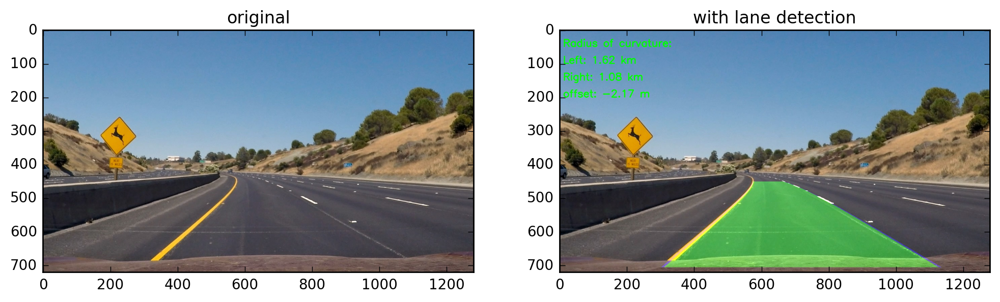

In [52]:

converted_img = lane_detector.pipeline(test_images[1])
plt.figure(figsize = (12, 8))
ax = plt.subplot(1, 2, 1)
ax.set_title('original')
ax.imshow(cv2.cvtColor(test_images[1], cv2.COLOR_BGR2RGB))
ax2 = plt.subplot(1, 2, 2)
ax2.set_title('with lane detection')
ax2.imshow(converted_img)

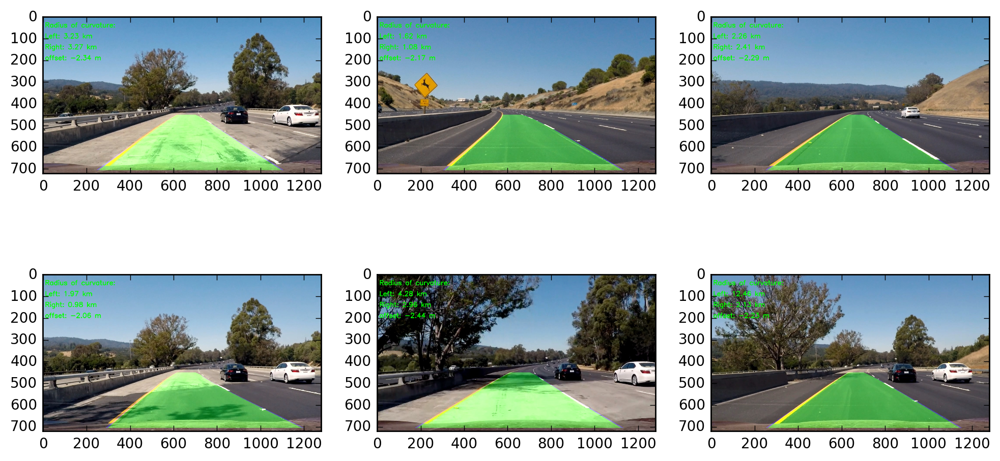

In [53]:
plt.figure(figsize=(12, 6))
for i, test_img in enumerate(test_images):
    converted_img = lane_detector.pipeline(test_img)
    ax = plt.subplot(2,3,i+1)
#     ax.set_title('combined')
    ax.imshow(converted_img)

In [63]:
# this actually works fairly well already, but is a bit slow
output = 'project_video_out_test_pipeline2_sub.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(0,10)
clipout = clip1.fl_image(lane_detector.pipeline)
%time clipout.write_videofile(output, audio=False, verbose=False, progress_bar=False)


CPU times: user 2min 59s, sys: 19.6 s, total: 3min 19s
Wall time: 2min 36s


In [116]:
class Line(object):
    def __init__(self, params):
        self.__dict__.update(params)
        # was the line detected in the last iteration?
params = {
    'detected' : False , 
    # x values of the last n fits of the line
    'recent_xfitted' : [], 
    #average x values of the fitted line over the last n iterations
    'bestx' : None,    
    #polynomial coefficients averaged over the last n iterations
    'best_fit' : None , 
    #polynomial coefficients for the most recent fit
    'current_fit' : [np.array([False])], 
    #radius of curvature of the line in some units
    'radius_of_curvature' : None, 
    #distance in meters of vehicle center from the line
    'line_base_pos' : None, 
    #difference in fit coefficients between last and new fits
    'diffs' : np.array([0,0,0], dtype='float'), 
    #x values for detected line pixels
    'allx' : None,  
    #y values for detected line pixels
    'ally' : None
}


In [98]:
 class detector2:
    def __init__(self, camera_calibration, M, Minv, leftline, rightline,color_threshold_method='RGB', 
                 color_thresh = (70,255), lane_finding_method='histogram'):
        self.image= None
        self.input = None
        
        self.camera_calibration = camera_calibration
        self.color_thresh = color_thresh
        self.color_threshold_method = color_threshold_method
        self.mtx = camera_calibration['mtx']
        self.dist = camera_calibration['dist']
        self.M = M
        self.Minv = Minv
        self.binary_image = None
        self.lane_finding_method = lane_finding_method
        self.leftline = leftline
        self.rightline = rightline
        
    def chlaheEqualisze(self, img):
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        imgs = []
        for i in range(img.shape[2]):
            img_chan = img[:,:,i]
            cl = clahe.apply(img_chan)
            imgs.append(cl)

        eq_img = np.stack(np.array(imgs), axis=0)
        eq_img = np.rollaxis(eq_img, 0, 3)
        return eq_img.copy()
        
    def sobel_thresholding(self, inputImg, sksize = 3,threshx = (15,90),threshy = (30, 90)
                               ,mag_thresh = (30,100), dir_thresh = (0.7, 1.3)):
        
        
        """
        # binary thresholding
        sksize = 3
        threshx = (15,90)
        threshy = (20, 90)
        mag_thresh = (30,100)
        dir_thresh = (0.7, 1.3)
        color_thresh = (70,255)
        """
    
        def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            if orient == 'x':
                sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
            else:
                sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

            abs_sobel = np.absolute(sobel)
            scaled = np.uint8(255 * abs_sobel/np.max(abs_sobel))
            grad_binary = np.zeros_like(scaled)
            grad_binary[(scaled >= thresh[0]) & (scaled <= thresh[1])] = 1
            return grad_binary

        def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
            sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
            mag = np.sqrt(np.square(sobelx) + np.square(sobely))
            scaled = np.uint8(255 * mag/np.max(mag))
            mag_binary = np.zeros_like(scaled)
            mag_binary[(scaled >= mag_thresh[0]) & (scaled <= mag_thresh[1])] = 1
            return mag_binary

        def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
            sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
            abs_gradient = np.arctan2(np.absolute(sobely) ,np.absolute(sobelx))
            dir_binary = np.zeros_like(abs_gradient)
            dir_binary[(abs_gradient >= thresh[0]) & (abs_gradient <= thresh[1])] = 1
            return dir_binary

        def calculate_thresholded_imgs(inputImg, sksize = 3,threshx = (15,90),threshy = (30, 90)
                                   ,mag_thresh = (30,100), dir_thresh = (0.7, 1.3)):
            gradx = abs_sobel_thresh(inputImg, orient='x', sobel_kernel=sksize, thresh=threshx)
            grady = abs_sobel_thresh(inputImg, orient='y', sobel_kernel=sksize, thresh=threshy)
            mag_binary = mag_threshold(inputImg, sobel_kernel=sksize, mag_thresh=mag_thresh)
            dir_binary = dir_threshold(inputImg, sobel_kernel=sksize, thresh = dir_thresh)

            return gradx, grady, mag_binary, dir_binary

        def calculate_combined_sobel(gradx, grady, mag_binary, dir_binary):
            combined = np.zeros_like(dir_binary)
            combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
            return combined
        
        gradx_img, grady_img, mag_binary_img, dir_binary_img = calculate_thresholded_imgs(inputImg, sksize ,threshx,threshy,mag_thresh, dir_thresh)
        return calculate_combined_sobel(gradx_img, grady_img, mag_binary_img, dir_binary_img)
        
        

    def combined_thresholding(self, sobel_bin, color_binary):   
        combined = np.zeros_like(sobel_bin)
        combined[(sobel_bin == 1) | (color_binary == 1)] = 1
        return combined

        
    def color_thresholding_pipeline(self, img):
        def color_threshold(img, thresh=(0,255), cspace= 'HLS'):
            if cspace== 'HLS':        
                img_transformed = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
            else:
                img_transformed = img
            channel = img_transformed[:,:,2] #if using the R channel it's also the last one
            binary_output = np.zeros_like(channel)
            binary_output[(channel >= thresh[0]) & (channel <= thresh[1])] = 1
            return binary_output
        def calculate_combined_color(hls_binary, bgr_binary):
            combined = np.zeros_like(hls_binary)
            combined[(hls_binary == 1) & (bgr_binary == 1)] = 1
            return combined
        
        hls_binary = color_threshold(img, thresh=(70,255), cspace= 'HLS')
        bgr_binary = color_threshold(img, thresh=(150,255), cspace= 'RGB')
        
        return  calculate_combined_color(hls_binary, bgr_binary), hls_binary, bgr_binary
    
    def histogram_method(self, binary_image):
        histogram = np.sum(binary_image[binary_image.shape[0]//2:,:], axis=0)
        midpoint = np.int(histogram.shape[0]/2)
        left_peak = np.argmax(histogram[:midpoint])
        right_peak = np.argmax(histogram[midpoint:]) + midpoint
        
        nwindows = 9
        window_height = np.int(binary_image.shape[0] / nwindows)

        # find where all the potenial lane pixels are
        nonzero = binary_image.nonzero()
        nonzero_x = np.array(nonzero[1])
        nonzero_y = np.array(nonzero[0])
        
        # make copy of image to work with
        im= np.copy(binary_image)
        img_cur = np.stack((im, im, im), -1) * 255
        # set the peak positions
        leftpeak_curr = left_peak
        rightpeak_curr = right_peak

        margin= 150
        minpix =30

        leftlaneidx = []
        rightlaneidx = []
        
        for i in range(nwindows):
            #get coordinates of the windows
            win_y_bottom = img_cur.shape[0] - (i + 1) * window_height
            win_y_top = img_cur.shape[0] - i * window_height
            win_x_left_low = leftpeak_curr - margin
            win_x_left_high = leftpeak_curr + margin
            win_x_right_low = rightpeak_curr - margin
            win_x_right_high = rightpeak_curr + margin

            left_indexes = ((nonzero_y >= win_y_bottom) & (nonzero_y < win_y_top) & 
                            (nonzero_x >= win_x_left_low) & (nonzero_x < win_x_left_high)).nonzero()[0]
            right_indexes = ((nonzero_y >= win_y_bottom) & (nonzero_y < win_y_top) & 
                            (nonzero_x > win_x_right_low) & (nonzero_x < win_x_right_high)).nonzero()[0]

            leftlaneidx.append(left_indexes)
            rightlaneidx.append(right_indexes)
            
            if len(left_indexes) > minpix:
                leftpeak_curr = np.int(np.mean(nonzero_x[left_indexes]))
                cv2.rectangle(img_cur, (win_x_left_low, win_y_bottom), (win_x_left_high, win_y_top), (0,255,0), 2)
            if len(right_indexes) > minpix:
                rightpeak_curr = np.int(np.mean(nonzero_x[right_indexes]))
                cv2.rectangle(img_cur, (win_x_right_low, win_y_bottom), (win_x_right_high, win_y_top), (0,255,0), 2)

        leftlaneidx = np.concatenate(leftlaneidx)
        rightlaneidx = np.concatenate(rightlaneidx)
        
        leftx = nonzero_x[leftlaneidx]
        lefty = nonzero_y[leftlaneidx] 
        rightx = nonzero_x[rightlaneidx]
        righty = nonzero_y[rightlaneidx] 
        
        return leftx,lefty, rightx, righty
    
    def radius_of_curvature_calc(self, left_xvals,right_xvals, y_vals, y_eval ):
        ym_per_pix = 30/360 # meters per pixel in y dimension
        xm_per_pix = 3.7/950 # meters per pixel in x dimension
        
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(y_vals * ym_per_pix, left_xvals*xm_per_pix, 2)
        right_fit_cr = np.polyfit(y_vals * ym_per_pix, right_xvals*xm_per_pix, 2)
        # radius of curvature in real space
        left_curverad_actual = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad_actual = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
        left_xval = left_fit_cr[2] + left_fit_cr[1] *y_eval*ym_per_pix + left_fit_cr[0] *(y_eval*ym_per_pix )**2
        right_xval = right_fit_cr[2] + right_fit_cr[1] *y_eval*ym_per_pix + right_fit_cr[0] *(y_eval*ym_per_pix ) **2
        
        offset_from_center = 0.5 * (left_xval + right_xval) - xm_per_pix * self.image.shape[1]
        return left_curverad_actual, right_curverad_actual, offset_from_center
    
    def sanity_check(self, left_polyfit, right_polyfit, left_curverad, right_curverad, y_eval):
        ym_per_pix = 3.7/950
        lanewidth_top = (right_polyfit[2] - left_polyfit[2]) * ym_per_pix
        lanewidth_bottom =((right_polyfit[2] + right_polyfit[1] *y_eval + right_polyfit[0] *y_eval**2) 
                           - (left_polyfit[2] + left_polyfit[1] *y_eval + left_polyfit[0] *y_eval**2)) * ym_per_pix
    
        if lanewidth_top < 2 or lanewidth_top > 5:
            return False
        if lanewidth_bottom < 2 or lanewidth_bottom > 5:
            return False
        if left_curverad / right_curverad > 2 or left_curverad / right_curverad < 0.5:
            return False
        
        return True
    
    def pipeline(self, imgInput):
        self.image = imgInput
        undistorted = cv2.undistort(imgInput, self.mtx, self.dist, None, self.mtx)
        imgInput_cv2 = cv2.cvtColor(undistorted, cv2.COLOR_RGB2BGR)
        img = cv2.GaussianBlur(undistorted,(3,3),0)    
        img = self.chlaheEqualisze(img)
        color_bin_combined, hls_binary, bgr_binary = self.color_thresholding_pipeline(img)
        if self.color_threshold_method =='RGB':           
            color_bin = bgr_binary
        elif self.color_threshold_method == 'HLS':
            color_bin = hls_binary
        else :
            color_bin = color_bin_combined
            
        sobel_bin = self.sobel_thresholding(imgInput)
        binary_img = self.combined_thresholding(sobel_bin, color_bin)
        
        #project to birds eye view:
        topview = cv2.warpPerspective(binary_img, M, (binary_img.shape[1], binary_img.shape[0]), flags=cv2.INTER_LINEAR)
        topview_img = np.stack([topview, topview, topview], axis = -1) #* 255
        
#         if self.lane_finding_method== 'histogram':
        leftx,lefty, rightx, righty = self.histogram_method(topview)
            
       # todo inplemenrt sliding widnow method

        
        # Fit a second order polynomial to each
        left_polyfit = np.polyfit(lefty, leftx, 2)
        right_polyfit = np.polyfit(righty, rightx, 2)

        plotvals = np.linspace(0, topview.shape[0] - 1, topview.shape[0])
        left_xvals = left_polyfit[2] + left_polyfit[1] * plotvals + left_polyfit[0] * plotvals **2
        right_xvals = right_polyfit[2] + right_polyfit[1] * plotvals + right_polyfit[0] * plotvals **2
        
        left_curverad_actual_curr, right_curverad_actual_curr, offset_curr = self.radius_of_curvature_calc(left_xvals,right_xvals, plotvals, topview.shape[0] )
        
        is_detection_okay = self.sanity_check(left_polyfit, right_polyfit, left_curverad_actual_curr, right_curverad_actual_curr, self.image.shape[0])
        
        if is_detection_okay == True or len(self.leftline.recent_xfitted) == 0:
            self.leftline.recent_xfitted.append(left_xvals)
            self.rightline.recent_xfitted.append(right_xvals)
        
        if len(self.leftline.recent_xfitted) > 5:
            self.leftline.recent_xfitted = self.leftline.recent_xfitted[-5:]
        if len(self.rightline.recent_xfitted) > 5:
            self.rightline.recent_xfitted = self.rightline.recent_xfitted[-5:]
        
        self.leftline.bestx = np.average( np.array(self.leftline.recent_xfitted), axis=0)
        self.rightline.bestx = np.average( np.array(self.rightline.recent_xfitted), axis=0)
        
        left_curverad_actual, right_curverad_actual, offset = self.radius_of_curvature_calc(self.leftline.bestx,self.rightline.bestx, plotvals, topview.shape[0] )
        img_with_lanes = helpers.draw_lane_lines(undistorted, self.leftline.bestx, self.rightline.bestx, plotvals, self.Minv)
        
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img_with_lanes,'Radius of curvature:',(10,50), font, 1,(0,255,0),2,cv2.LINE_AA)
        cv2.putText(img_with_lanes,'Left: ' + str(round(left_curverad_actual/1000, 2)) + ' km',(10,100), font, 1,(0,255,0),2,cv2.LINE_AA)
        cv2.putText(img_with_lanes,'Right: ' +str(round(right_curverad_actual/1000, 2)) + ' km', (10,150), font, 1,(0,255,0),2,cv2.LINE_AA)
        cv2.putText(img_with_lanes,'offset: ' +str(round(offset, 2)) + ' m', (10,200), font, 1,(0,255,0),2,cv2.LINE_AA)
#         cv2.putText(img_with_lanes,'sanity check: ' + str(is_detection_okay), (10,250), font, 1,(0,255,0),2,cv2.LINE_AA)

        return cv2.cvtColor(img_with_lanes, cv2.COLOR_BGR2RGB)

In [117]:
leftline = Line(params)
rightline = Line(params)
lane_detector2 = detector2(camera_calibration, M, Minv,leftline, rightline, color_threshold_method='combined', 
                 color_thresh = (200,255), lane_finding_method='histogram')

In [97]:
output = 'project_video_out_test_pipeline4_sanity_check_v2.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(0,10)
clipout = clip1.fl_image(lane_detector2.pipeline)
%time clipout.write_videofile(output, audio=False, verbose=False, progress_bar=False)


CPU times: user 2min 59s, sys: 19.9 s, total: 3min 19s
Wall time: 2min 34s


In [100]:
output = 'project_video_out_pipeline_v2all.mp4'
clip1 = VideoFileClip("project_video.mp4")
clipout = clip1.fl_image(lane_detector2.pipeline)
%time clipout.write_videofile(output, audio=False, verbose=False, progress_bar=False)

CPU times: user 14min 35s, sys: 1min 33s, total: 16min 8s
Wall time: 11min 59s


In [118]:
# use a shorter section of the road
output = 'project_video_out_pipeline_v3all.mp4'
clip1 = VideoFileClip("project_video.mp4")
clipout = clip1.fl_image(lane_detector2.pipeline)
%time clipout.write_videofile(output, audio=False, verbose=False, progress_bar=False)

CPU times: user 14min 53s, sys: 1min 43s, total: 16min 37s
Wall time: 12min 16s
